## Part 1. Sound Analysis

The assigned sound is a fragment of a beijing opera (https://freesound.org/people/xserra/sounds/162045/) containing a man's voice with falsetto and multiple noisy and inharmonic percussion instruments.

It already had a wav format, 44.1 KHz and 16 bits depth. By using audacity we converted it to mono and trimmed it to a 2.8-second segment from approximately 15 to 18 seconds. We chose a fragment that combines three different percussion sounds. The first is a noisy stick hit, the second is a pitched gong-like sound, and the third is a gong hit with a strong attack. This combination provides a rich and varied texture for further analysis and transformation.

In [ ]:
import numpy as np
from scipy.signal import get_window
import matplotlib.pyplot as plt
import IPython.display as ipd

from smstools.models import utilFunctions as UF
from smstools.models import stft as STFT
from smstools.transformations import stftTransformations as STFTT 
from smstools.transformations import stochasticTransformations as STOT
from smstools.transformations import sineTransformations as ST
from smstools.models import spsModel as SPS
from smstools.models import stochasticModel as SM
from smstools.models import sineModel as SIM
import IPython.display as ipd


### Reading of the sound

Temporal Description: 

I chose a 2.8-second snippet of the assigned Beijing Opera sound because it contains a variety of contrasting percussive events, making it  interesting for spectral analysis. The snippet combines three different timbres:

* One that sounds like a transient hit: a wooden stick hit, very short and sharp.

* One that sounds like a pitched gong: a resonant inharmonic sound with a perceivable pitch and a smooth decay. The sound can have a feel of a string instrument. It could be a Xiaoluo (small gong), which has a metallic resonant tone but can produce multiple beating partials, giving a complex harmonic/inharmonic sound

* One that sounds like a cymbal or a Gong, noisy, broadband with no stable harmonic structure.

The combination of different attacks, inharmonic structures, and high-frequency components makes it very interesting for experimenting with spectral models. The sound must be analyzed with proper parameters so that the different fast transients can be captured (temporal resolution) and adequate frequency resolution to resolve the inharmonic partials of the instruments

Text(0.5, 1.0, 'input sound: x')

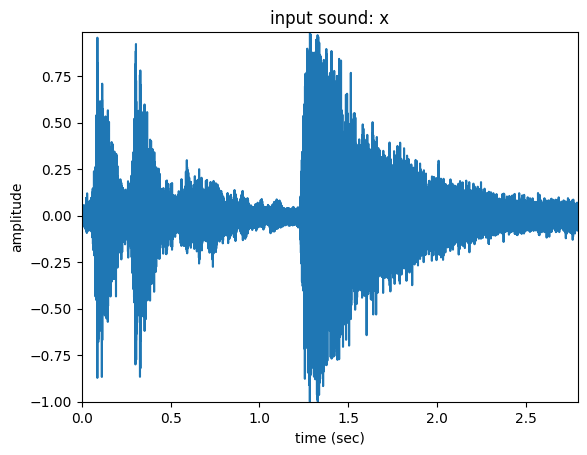

In [ ]:
#Part 1
input_file = '../sounds/final_sound.wav'
(fs, x) = UF.wavread(input_file)

N = len(x)
#plot the input
plt.plot(np.arange(x.size)/float(fs), x)
plt.axis([0, x.size/float(fs), min(x), max(x)])
plt.ylabel('amplitude')
plt.xlabel('time (sec)')
plt.title('input sound: x')

### STFT Analysis

Text(0.5, 1.0, 'magnitude spectrogram')

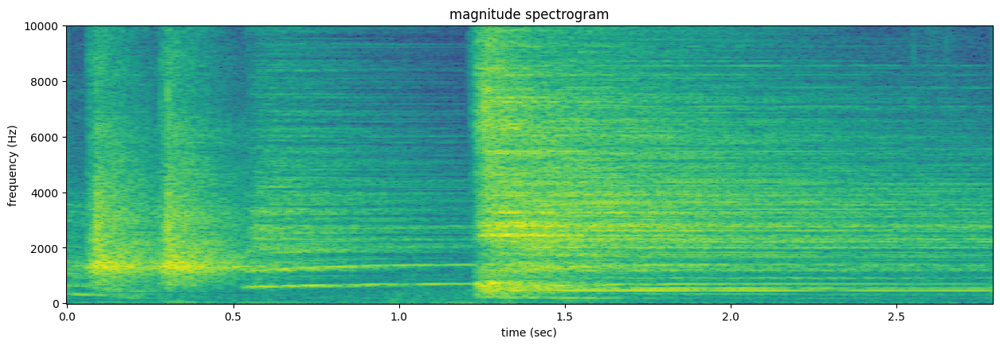

In [238]:
### set the parameters
window ='blackman'
M = 2001
N = 2048

H = 256

w = get_window(window, M, fftbins=True)

ipd.display(ipd.Audio(data=x, rate=fs))


# plot and play input magnitude spectrogram
mX, pX = STFT.stftAnal(x, w, N, H)

ipd.display(ipd.Audio(data=x, rate=fs))
#ipd.display(ipd.Audio(data=y, rate=fs))

plt.figure(figsize=(15, 10))
plt.subplot(2,1,2)
maxplotfreq = 10000.0
numFrames = int(mX[:,0].size)
frmTime = H*np.arange(numFrames)/float(fs)
binFreq = fs*np.arange(N*maxplotfreq/fs)/N
plt.pcolormesh(frmTime, binFreq, np.transpose(mX[:,:int(N*maxplotfreq/fs+1)]))
plt.xlabel('time (sec)')
plt.ylabel('frequency (Hz)')
plt.title('magnitude spectrogram')

#### Analysis of the sound
For the STFT analysis we chose the following parameters:

*  Window type: We selected the 'Blackman' window for its good mainlobe width and side-lobe suppression balance, which prevents energy from strong transients (e.g., cymbal hits) from leaking into quieter parts of the spectrum.

* Window size : M  was chosen to be 2001 samples as it is an indermediate size that balances temporal and frequency resolution. Large enough to resolve the inharmonic partials of the instruments in event 2 and 3, but still short enough to capture the sharp attacks.

* FFT size (N): We chose the next power of 2 after M (2048) as it ensures smooth, adequate spectral representation.

* Hop size (H): 256 samples as H provide a dense time sampling to accurately track rapid changes, especially the sharp attacks of the percussive hits.




#### Spectral Description (Frequency Domain)

On the spectrogram, we can see that the first event is very noisy, with no stable frequencies, while events 2 and 3 show some partially stable resonances. This explains why the gongs sound more pitched or “harmonic” than the first event, even though they are technically inharmonic.

Regarding the attacks: events 1 and 3 have very sharp, strong attacks, whereas event 2 is smoother and less noisy.

Event 1 is essentially broadband noise, with energy spread across the frequency spectrum rather than concentrated in discrete partials.

Event 2 has a complex inharmonic structure, with partials that do not correspond to integer multiples of a fundamental, producing spectral roughness. A slight pitch glide is also visible in the spectrogram. Compared to the other two events, it's not noisy.

Event 3 seems like a combination of the two, as it is very noisy, especially during the attack, but some more stable partials can be captured especially during the decay.

The spectrogram clearly highlights these differences: transients appear as vertical lines, sustained gong partials as horizontal streaks, and noisy components as diffuse energy. This representation helps visualize both the temporal and spectral characteristics of the percussion sounds.

### Partial representations

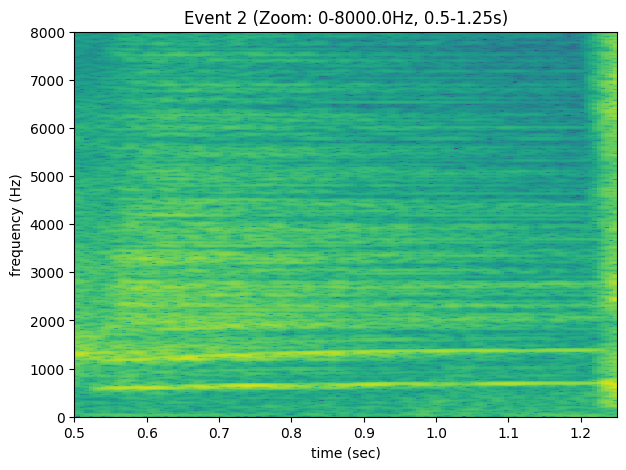

In [239]:
min_time = 0.5    # Start time in seconds
max_time = 1.25      # End time in seconds   #secon part: 0.5-1.2, 0-3000 Hz
min_freq = 0    # Bottom frequency in Hz
max_freq = 8000.0   # Top frequency in Hz

plt.figure(figsize=(7, 5))

# 1. Create the full time axis
numFrames = int(mX[:, 0].size)
frmTime = H * np.arange(numFrames) / float(fs)

# 2. Create the full frequency axis (based on the size of mX)
# mX columns = N/2 + 1
numBins = mX.shape[1] 
binFreq = fs * np.arange(numBins) / float(N)

# 3. Plot the data
plt.pcolormesh(frmTime, binFreq, np.transpose(mX), shading='auto')

# 4. Apply the Zoom
plt.axis([min_time, max_time, min_freq, max_freq])

# Labels
plt.xlabel('time (sec)')
plt.ylabel('frequency (Hz)')
plt.title(f'Event 2 (Zoom: {min_freq}-{max_freq}Hz, {min_time}-{max_time}s)')

plt.show()

In this zoomed spectrogram, we can notice the more stable partials of event 2 and the absence of noise, making it sounding more pitchy than the other events

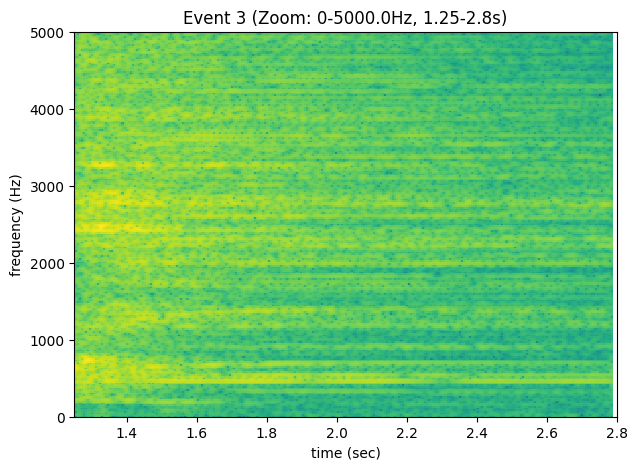

In [241]:
min_time = 1.25    # Start time in seconds
max_time = 2.8      # End time in seconds   #secon part: 0.5-1.2, 0-3000 Hz
min_freq = 0    # Bottom frequency in Hz
max_freq = 5000.0   # Top frequency in Hz

plt.figure(figsize=(7, 5))

# 1. Create the full time axis
numFrames = int(mX[:, 0].size)
frmTime = H * np.arange(numFrames) / float(fs)

# 2. Create the full frequency axis (based on the size of mX)
# mX columns = N/2 + 1
numBins = mX.shape[1] 
binFreq = fs * np.arange(numBins) / float(N)

# 3. Plot the data
# We transpose mX so time is on X-axis and Freq is on Y-axis
plt.pcolormesh(frmTime, binFreq, np.transpose(mX), shading='auto')

# 4. Apply the Zoom
plt.axis([min_time, max_time, min_freq, max_freq])

# Labels
plt.xlabel('time (sec)')
plt.ylabel('frequency (Hz)')
plt.title(f'Event 3 (Zoom: {min_freq}-{max_freq}Hz, {min_time}-{max_time}s)')

plt.show()

Here we can see the stable partials of the 3rd event. It starts as very noisy, but its decay has some stable but inharmonic partials. In general the third event is much more dense and noisy than the second one.

To show the onsets of the sound and energy distributions and see the differences between the 3 events we use functions from lab 4 

In [22]:
def compute_eng_env(input_file, window, M, N, H):
    (fs,x) = UF.wavread(input_file)
    w = get_window(window, M) 
    mX, mP = STFT.stftAnal(x, w, N, H) #mx.shape[1]--> k bins, mx.shape[0]--> time frames
    print(mX.shape)
    f = np.arange(mX.shape[1])*fs/N 
    k1 = np.where((f>0) & (f<3000))[0] #find k bins that correspond to the frequency bands we want
    k2 = np.where((f<10000) & (f>3000))[0]
    print('Number of k bins for low frequency band:',len(k1))
    print('Number of k bins for high frequency band:',len(k2))
    mag = 10 ** (mX / 20) 
    #for every frame i compute the energy envelope for the computed k
    band1_energy = np.sum(mag[:, k1]**2, axis=1)
    band2_energy = np.sum(mag[:, k2]**2, axis=1)
    #print(len(band1_energy), len(band2_energy))
    energ_env = np.zeros((mag.shape[0], 2))
    #print(energ_env.shape)
    energ_env[:, 0] = band1_energy
    energ_env[:, 1] = band2_energy
    energ_envdB = 10 * np.log10(energ_env + 1e-12) 
    return mX, energ_envdB

    


In [ ]:
def compute_odf(input_file, window, M, N, H):
    """Compute a simple onset detection function (ODF) using the STFT.

    Args:
        input_file (str): input sound file (monophonic with sampling rate of 44100)
        window (str): analysis window type (rectangular, triangular, hanning, hamming, blackman, or blackmanharris)
        M (int): analysis window size (odd integer value)
        N (int): fft size (power of two, bigger or equal than than M)
        H (int): hop size for the STFT computation

    Result:
            np.array: magnitude spectra of sound (2D array)
            np.array: D numpy array with ODF computed in band 0 < f < 3000 Hz (in dB) in first column, [:,0]
            np.array: ODF computed of band 3000 < f < 10000 Hz (in dB) in second column [:,1]
    """


    mX, en_env = compute_eng_env(input_file, window, M, N, H)
    
    DE = en_env[1:, :] - en_env[:-1]
    DE = np.vstack((np.zeros((1, 2)), DE))
    ODF = np.maximum(0, DE)
    return mX, ODF
    

    


(481, 2049)
Number of k bins for low frequency band: 278
Number of k bins for high frequency band: 650


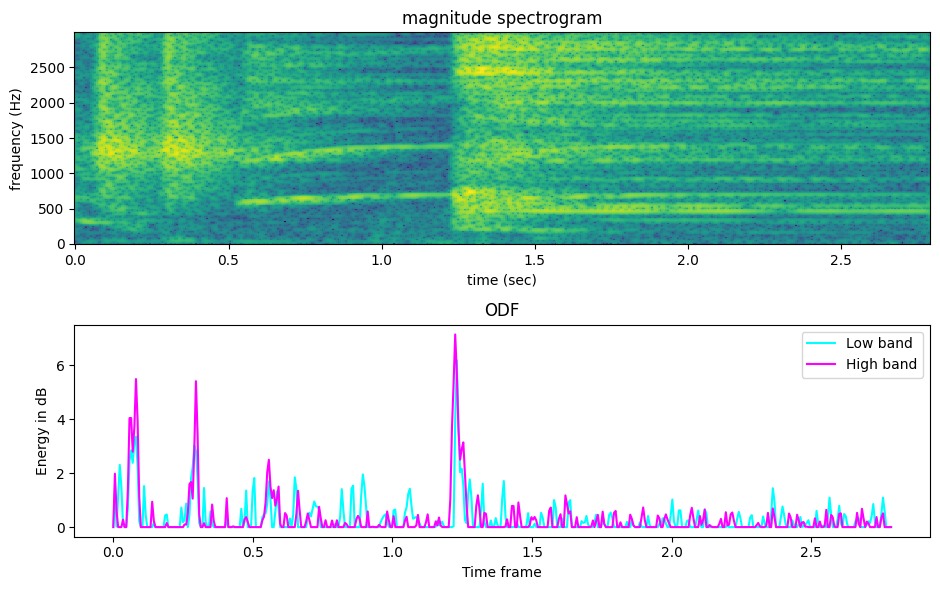

In [ ]:
mX, ODF = compute_odf(r"..\sounds\final_sound.wav", 'blackman', M,N,H)

plt.figure(1, figsize=(9.5, 6))
#spectrogram
plt.subplot(211)
maxplotfreq = 3000.0
numFrames = int(mX[:,0].size)
frmTime = H*np.arange(numFrames)/float(fs)
binFreq = fs*np.arange(N*maxplotfreq/fs)/N
plt.pcolormesh(frmTime, binFreq, np.transpose(mX[:,:int(N*maxplotfreq/fs+1)]))
plt.xlabel('time (sec)')
plt.ylabel('frequency (Hz)')
plt.title('magnitude spectrogram')
#ODF plot
plt.subplot(212)
frames = int(mX[:,0].size)
frame_time = H*np.arange(frames)/float(fs)
plt.plot(frame_time, ODF[:, 0], color='cyan', label='Low band')
plt.plot(frame_time, ODF[:, 1], color='magenta', label='High band')
plt.xlabel('Time frame')
plt.ylabel('Energy in dB')
plt.legend()
plt.title('ODF')

plt.tight_layout()
plt.show()












The onset detection function (ODF), computed from frame-to-frame positive energy differences, highlights the exact timing of the attacks, verifying that event 1 and 3 have much stronger attacks than event 2. The ODF is splitted into low (0–3000 Hz) and high (3000–10000 Hz) frequency bands, which allows us to the high-frequency dominance in our percussion sound.

## Part 2. Theme and variations (option b)

Since the sound is largely inharmonic and does not contain harmonic relationships like most Western instruments, a harmonic model analysis would not provide meaningful results. Instead, we based our transformations on STFT and sinusoidal + stochastic (SMS) analysis, which can  capture both the transient/noisy components and the partially stable resonances of the percussion sounds.

As the initial audio is noisy and inharmonic, my initial idea was to try and create soundscape, urban, ambient sounds and combine them into a final composition.

### Filtering

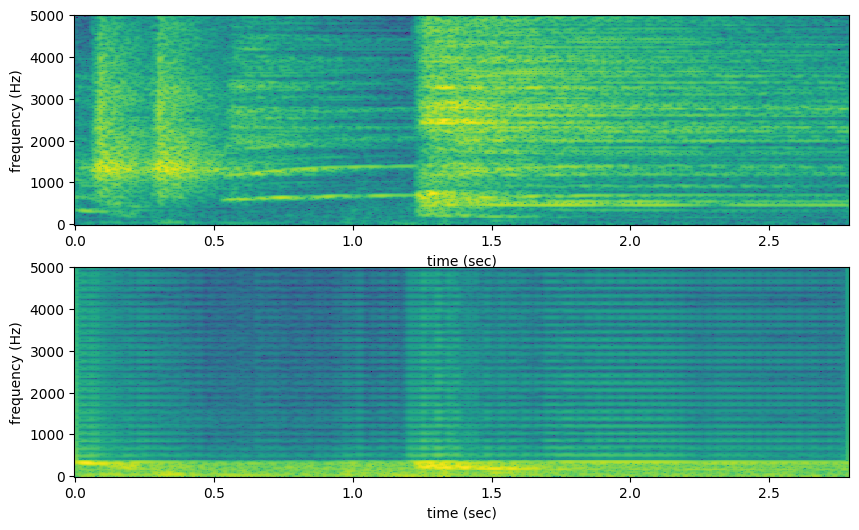

In [ ]:
#FILTERING
from smstools.transformations import stftTransformations as STFTT
window ='blackman'
M = 2001
N = 2048
H = 256
input_file = '../sounds/final_sound.wav'
(fs, x) = UF.wavread(input_file)
w = get_window(window, M, fftbins=True)

# 1. Calculate which bin corresponds to 200Hz
#    Math: Target_Freq * N / Sampling_Rate
cutoff_bin = int(350 * N / fs) 

# 2. Create the array (Start with full volume 0dB)
filter = np.zeros(N // 2 + 1)

#    Keep everything below 200Hz (0dB).
#    Cut everything above 200Hz (-100dB).
filter[cutoff_bin:] = -100


y_bass = STFTT.stftFiltering(x, fs, w, N, H, filter)
ipd.display(ipd.Audio(data=y_bass, rate=fs))

# compute the magnitude and phase spectrogram of input sound 
mX1, pX1 = STFT.stftAnal(x, w, N, H)
# compute the magnitude and phase spectrogram of output sound 
mY, pY = STFT.stftAnal(y_bass, w, N, H)

# create figure to plot
plt.figure(figsize=(10, 6))
# frequency range to plot
maxplotfreq = 5000.0

# plot magnitude spectrogram of sound 1
plt.subplot(2, 1, 1)
numFrames = int(mX1[:, 0].size)
frmTime = H * np.arange(numFrames) / float(fs)
binFreq = fs * np.arange(N * maxplotfreq / fs) / N
plt.pcolormesh(frmTime, binFreq, np.transpose(mX1[:, : int(N * maxplotfreq / fs) + 1]))
plt.xlabel("time (sec)")
plt.ylabel("frequency (Hz)")

# plot magnitude spectrogram of morphed sound
plt.subplot(2, 1, 2)
numFrames = int(mY[:, 0].size)
frmTime = H * np.arange(numFrames) / float(fs)
binFreq = fs * np.arange(N * maxplotfreq / fs) / N
plt.pcolormesh(frmTime, binFreq, np.transpose(mY[:, : int(N * maxplotfreq / fs) + 1]))
plt.xlabel("time (sec)")
plt.ylabel("frequency (Hz)")
plt.show()



For the analysis, we used the same parameters as in Part 1. To create a deep-low frequency version of the sound, we applied a low-pass filter using the function stftFiltering(x, fs, w, N, H, filter). This function applies a frequency-dependent gain to the STFT of the sound and reconstructs the filtered signal. The filter was designed as a “wall” at 350 Hz: frequencies below 350 Hz were left unchanged (0 dB), while frequencies above 350 Hz were attenuated by -100 dB, effectively silencing them. The result removes high-pitched elements like the stick click and cymbal hiss, leaving only the low drum vibrations—a dull, deep sound that serves as a bass layer in the composition.

### Morphing
We wanted to change the value of balancef through time, so we modified the stftMorph function to accept balancef as an array. 

In [ ]:
import numpy as np
import math
from scipy.signal import resample
import smstools.models.dftModel as DFT

def stftMorph_dynamic(x1, x2, fs, w1, N1, w2, N2, H1, smoothf, balancef):
    """
    Modified Morph function that allows TIME-VARYING balance
    balancef: Can be a float (static) OR a numpy array of length L (dynamic)
    """

    M1 = w1.size
    hM1_1 = int(math.floor((M1 + 1) / 2))
    hM1_2 = int(math.floor(M1 / 2))
    
    # Calculate number of frames
    L = int(x1.size / H1) 
    
    # If balancef is a single number, turn it into an array
    if isinstance(balancef, (int, float)):
        balance_array = np.ones(L) * balancef
    # If it is an array but wrong size, stretch it to fit L
    elif isinstance(balancef, (np.ndarray, list)):
        balance_array = np.array(balancef)
        if len(balance_array) != L:
            # Simple interpolation to match frame count
            balance_array = np.interp(
                np.linspace(0, 1, L),
                np.linspace(0, 1, len(balance_array)),
                balance_array
            )
    else:
        raise ValueError("Invalid balancef type")

    if N2 / 2 * smoothf < 3: raise ValueError("Smooth factor too small")
    if smoothf > 1: raise ValueError("Smooth factor above 1")
    if H1 <= 0: raise ValueError("Hop size (H1) smaller or equal to 0")

    x1 = np.append(np.zeros(hM1_2), x1)
    x1 = np.append(x1, np.zeros(hM1_1))
    pin1 = hM1_1
    w1 = w1 / sum(w1)
    
    M2 = w2.size
    hM2_1 = int(math.floor((M2 + 1) / 2))
    hM2_2 = int(math.floor(M2 / 2))
    H2 = int(x2.size / L)
    x2 = np.append(np.zeros(hM2_2), x2)
    x2 = np.append(x2, np.zeros(hM2_1))
    pin2 = hM2_1
    
    y = np.zeros(x1.size)
    
    for l in range(L):
        # Analysis
        mX1, pX1 = DFT.dftAnal(x1[pin1 - hM1_1 : pin1 + hM1_2], w1, N1)
        mX2, pX2 = DFT.dftAnal(x2[pin2 - hM2_1 : pin2 + hM2_2], w2, N2)
        
        # Transformation
        mX2smooth = resample(np.maximum(-200, mX2), int(mX2.size * smoothf))
        mX2 = resample(mX2smooth, mX1.size)
        
        current_bal = balance_array[l]
        mY = current_bal * mX2 + (1 - current_bal) * mX1
       
        
        # Synthesis
        y[pin1 - hM1_1 : pin1 + hM1_2] += H1 * DFT.dftSynth(mY, pX1, M1)
        pin1 += H1
        pin2 += H2

    y = np.delete(y, range(hM1_2))
    y = np.delete(y, range(y.size - hM1_1, y.size))
    return y

Oboe sound:


Percussion sound:


Morphed sound:


Morphed and time-scaled sound:


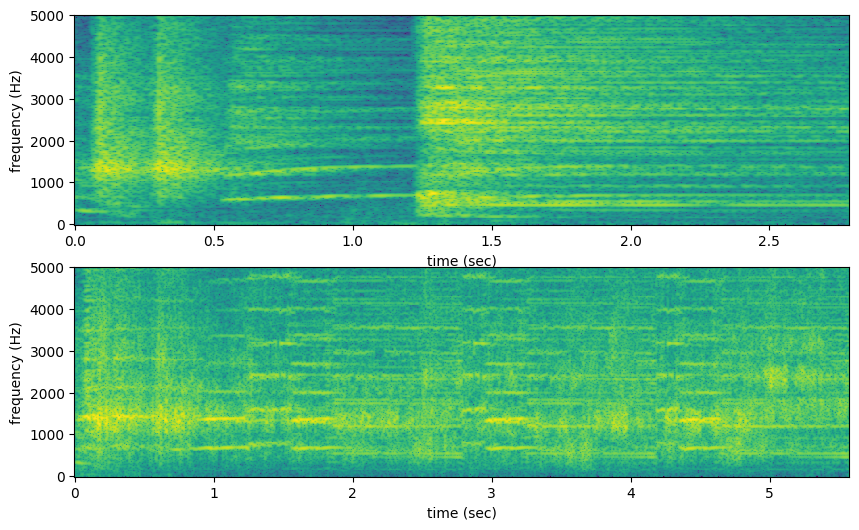

In [ ]:
#MORPHING
input_file2 = '../sounds/oboe_.wav'
(fs, x2) = UF.wavread(input_file2)
print("Oboe sound:")
ipd.display(ipd.Audio(data=x2, rate=fs))

input_file = '../sounds/final_sound.wav'
(fs, x) = UF.wavread(input_file)
print("Percussion sound:")
ipd.display(ipd.Audio(data=x, rate=fs))


w2 = get_window(window, M, fftbins=True)
N = 2048
N2 = 2048
balance_shape = np.array([0.2, 0.5, 0.8, 0.5, 0.2]) 

y_dynamic = stftMorph_dynamic(
    x, x2, fs, 
    w, N, w, N, H, 
    smoothf=0.2,          # Keep flute texture smooth
    balancef=balance_shape # Pass the array here
)
print("Morphed sound:")
ipd.display(ipd.Audio(data=y_dynamic, rate=fs))

#TIME SCALING
window ='blackman'
M = 2001
N = 2048
t = -90
minSineDur = 0.02 
maxnSines = 80
freqDevOffset = 10
freqDevSlope = 0.001
stocf = 0.3

Ns = 512
H = 128
timeScaling = np.array([
    0.0, 0.0,    # Start at 0, 
    1.0, 1.0,    # Play to End (Input 1)
    
    0.5, 1.001,  #  o back to Input 0, 
    1.0, 1.5,    # Play to End (Input 1)
    
    0.5, 1.501,  # Go back to Input 0,
    1.0, 2.0     # Play to End (Input 1)
])
#Analyze with sine and stoch model and perform time stretching
tfreq, tmag, tphase, stocEnv = SPS.spsModelAnal(y_dynamic, fs, w, N, H, t, minSineDur, maxnSines, freqDevOffset, freqDevSlope, stocf)
ysfreq, ysmag = ST.sineTimeScaling(tfreq, tmag, timeScaling)
ystocEnv = STOT.stochasticTimeScale(stocEnv, timeScaling)
y_morph, yh, yst = SPS.spsModelSynth(ysfreq, ysmag, np.array([]), ystocEnv, Ns, H, fs)
print("Morphed and time-scaled sound:")
ipd.display(ipd.Audio(data=y_morph, rate=fs))


# compute the magnitude and phase spectrogram of input sound 
mX1, pX1 = STFT.stftAnal(x, w, N, H)
# compute the magnitude and phase spectrogram of output sound
mY, pY = STFT.stftAnal(y_morph, w, N, H)

# create figure to plot
plt.figure(figsize=(10, 6))
# frequency range to plot
maxplotfreq = 5000.0

# plot magnitude spectrogram of sound 1
plt.subplot(2, 1, 1)
numFrames = int(mX1[:, 0].size)
frmTime = H * np.arange(numFrames) / float(fs)
binFreq = fs * np.arange(N * maxplotfreq / fs) / N
plt.pcolormesh(frmTime, binFreq, np.transpose(mX1[:, : int(N * maxplotfreq / fs) + 1]))
plt.xlabel("time (sec)")
plt.ylabel("frequency (Hz)")

# plot magnitude spectrogram of morphed sound
plt.subplot(2, 1, 2)
numFrames = int(mY[:, 0].size)
frmTime = H * np.arange(numFrames) / float(fs)
binFreq = fs * np.arange(N * maxplotfreq / fs) / N
plt.pcolormesh(frmTime, binFreq, np.transpose(mY[:, : int(N * maxplotfreq / fs) + 1]))
plt.xlabel("time (sec)")
plt.ylabel("frequency (Hz)")
plt.show()


* Morphing:

We applied a dynamic Spectral Morph between the processed percussion sound and an oboe sample. The oboe sample was analyzed with the same STFT parameters, as it gave adequate results.  We implemented a time-varying balance envelope. The envelope starts at 0.2 and gradually goes to 0.8 and falls again to 0.2 (triangle shape).  At the start/end, the sound is 80% Percussion / 20% Oboe. In the middle, the sound swells to become 20% Percussion / 80% Oboe. 

Spectral Smoothing: I used a smoothing factor (smoothf) of 0.5 on the Oboe. This extracts the spectral envelope (formants/timbre) of the oboe without imposing its exact fundamental frequency. This allows the percussion to "use" the texture of the oboe without creating dissonance.
The two sounds are mixed using a method called STFT cross-synthesis. This method separates each sound into two parts: magnitude (its tone or timbre) and phase (its timing and rhythm).

In this process, the Beijing Opera percussion provides the phase, which means it controls the timing, rhythm, and sharp attacks. The oboe provides the magnitude, meaning its tone color is used.

The oboe sound is smoothed so the system keeps its general tone quality but not its exact pitch. When the two are combined, the oboe’s tone is shaped to follow the percussion’s rhythm. The result is a hybrid sound: the rhythm of the percussion played with the resonance and tone color of the oboe.

* Time stretching: 

After morphing, we re-analyzed the result using the Sinusoidal Plus Stochastic (SPS) Model. We then applied  time scaling to create a rhythmic repetition loop directly in the spectral domain. We wanted to repeat the last phrase a frew times so it would create an echo effect, by jumping the output audio to input's 0.5 second two times, thus repeating the second half of the audio.

We applied this scaling separately to the Sinusoidal components (pitch) and Stochastic components (noise) to maintain phase coherence before re-synthesizing (spsModelSynth).

The final audio combines the noise of the percussion, the tonal richness of the oboe, and subtle echoes, producing a complex, layered soundscape. The resulting texture could evoke the impression of noisy urban or traffic-like ambient sounds.

### Sinusoidal plus stochastic model analysis + transformations

For the analysis, we use as window, M and N the same parameters from part 1, as they gave adequate results.

Because the source is percussive, we set a relatively low peak threshold (–70 dB) and allowed a large number of possible sinusoids (max 80) to ensure that any brief,  peaks could be detected. The minimum sinusoid duration and frequency deviation parameters were kept permissive so that unstable, drifting partials could still form tracks if present. Finally, the stochastic factor (0.5) provides a smooth residual model suited to broadband noise components typical of percussion. Because the sound is composed by inharmonic percussion dominated by strong noisy transients, a stonger stochastic decimation factor (stocf = 0.5) gave good results. It preserves enough spectral detail to capture the characteristic brightness and texture of the hit, but it still smooths the envelope enough to avoid overfitting random frame-to-frame variations that carry no perceptual meaning.


Original sound:


Sinusoidal + stochastic model:


Stochastic component:


Sinusoidal component:


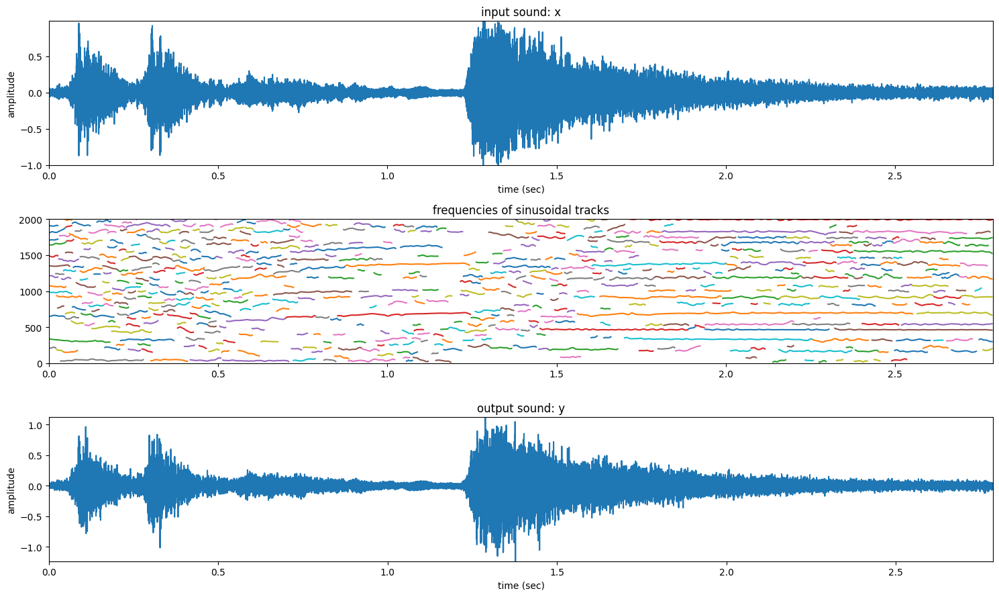

In [ ]:
# Perform sinusoidal and stochastic model analysis
window ='blackman'
M = 2001
N = 2048
t = -70
minSineDur = 0.02 
maxnSines = 80
freqDevOffset = 10
freqDevSlope = 0.001
stocf = 0.5

Ns = 512
H = 128 #has to be 1/4 of Ns

(fs, x) = UF.wavread(input_file)
w = get_window(window, M, fftbins=True)
tfreq, tmag, tphase, stocEnv = SPS.spsModelAnal(x, fs, w, N, H, t, minSineDur, maxnSines, freqDevOffset, freqDevSlope, stocf)
y, yh, yst = SPS.spsModelSynth(tfreq, tmag, tphase, stocEnv, Ns, H, fs)

y1 = SM.stochasticModelSynth(stocEnv, H, Ns, fs, melScale=1)
y2 = SIM.sineModelSynth(tfreq, tmag, tphase, Ns, H, fs)

print("Original sound:")
ipd.display(ipd.Audio(data=x, rate=fs))
print("Sinusoidal + stochastic model:")
ipd.display(ipd.Audio(data=y, rate=fs))
print("Stochastic component:")
ipd.display(ipd.Audio(data=y1, rate=fs))
print("Sinusoidal component:")
ipd.display(ipd.Audio(data=y2, rate=fs))

# create figure to show plots
plt.figure(figsize=(15, 9))
# frequency range to plot
maxplotfreq = 2000.0
# plot the input sound
plt.subplot(3,1,1)
plt.plot(np.arange(x.size)/float(fs), x)
plt.axis([0, x.size/float(fs), min(x), max(x)])
plt.ylabel('amplitude')
plt.xlabel('time (sec)')
plt.title('input sound: x')
# plot the sinusoidal frequencies
plt.subplot(3,1,2)
if (tfreq.shape[1] > 0):
    numFrames = tfreq.shape[0]
    frmTime = H*np.arange(numFrames)/float(fs)
    tfreq[tfreq<=0] = np.nan
    plt.plot(frmTime, tfreq)
    plt.axis([0, x.size/float(fs), 0, maxplotfreq])
    plt.title('frequencies of sinusoidal tracks')
# plot the output sound
plt.subplot(3,1,3)
plt.plot(np.arange(y.size)/float(fs), y)
plt.axis([0, y.size/float(fs), min(y), max(y)])
plt.ylabel('amplitude')
plt.xlabel('time (sec)')
plt.title('output sound: y')
plt.tight_layout()
plt.show()


The percussion sound is mainly transient and broadband, with short-lived or rapidly shifting partials. The Sinusoidal model is designed to detect long-lived, narrowband components, so when the energy is concentrated in brief, noisy, and inharmonic bursts, the model naturally finds few or no stable sinusoidal tracks. As expected, in the first highly inharmonic and noise-dominated section (0–0.5 s), no stable sinusoids are detected; the energy is therefore captured almost entirely by the stochastic model. In the later sections of the sound, we can notice more stable resonant bands, and the model begins to track these as sinusoidal components. This is consistent with the physical behavior of instruments like gongs, which even though are not entirely harmonic like western instruments, exhibit relatively stable resonant modes after the initial attack (as also seen in part 1).

The resynthesized sound is very similar to the original, however it wasn't possible to capture the loudness and exact texture of the transients (especially the last one of the gong), but the result was very similar.

### Sinusoidal component time scaling and filtering

Sinusoidal component:


After filtering:


Text(0.5, 1.0, 'magnitude spectrogram filtered')

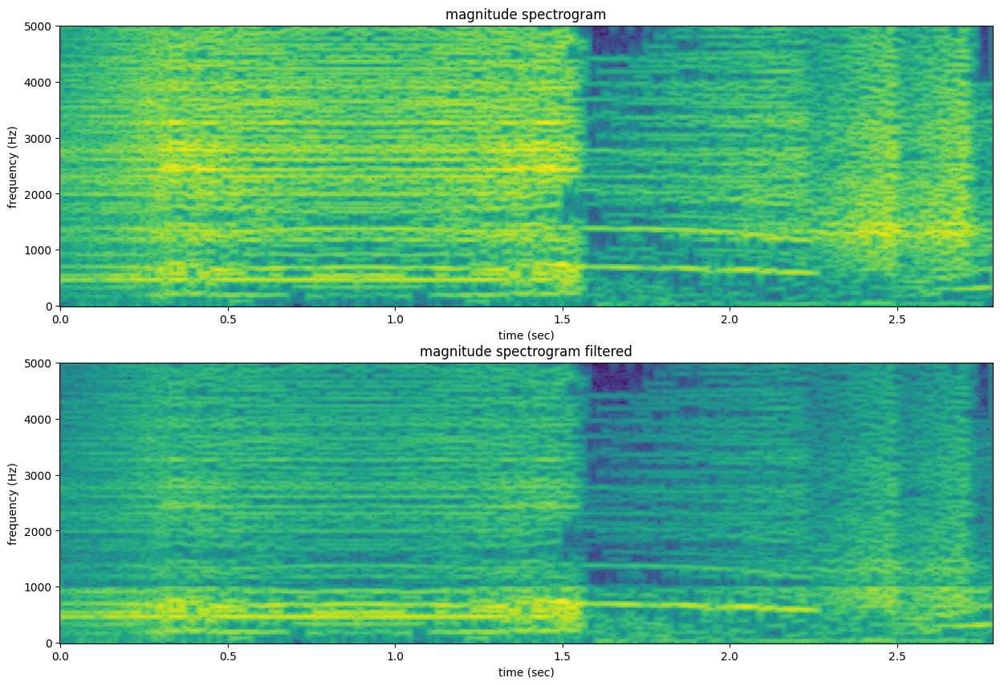

In [ ]:
window ='blackman'
M = 2001
N = 2048
t = -70
minSineDur = 0.02 
maxnSines = 80
freqDevOffset = 10
freqDevSlope = 0.001
stocf = 0.5
Ns = 512
H = 128

(fs, x) = UF.wavread(input_file)
w = get_window(window, M, fftbins=True)
tfreq, tmag, tphase, stocEnv = SPS.spsModelAnal(x, fs, w, N, H, t, minSineDur, maxnSines, freqDevOffset, freqDevSlope, stocf)

timeScaling2 = np.array([
    # [Input Time, Output Time]
    0.0, 2.5,    # Start
    0.5, 2.0,    # (Stick): Keep normal speed (0.5s duration)
    1.0, 1.5,    # (Gong): STRETCH 0.5s input -> 4.5s output
    1.2, 1.3,    # (Cymbal Attack): Keep normal speed (1.0s duration) to preserve the hit at ~1.3s
    1.7, 0.8,   # STRETCH 0.5s input -> 5.0s output
    1.2, 0.3,
    2.5, 0             
])

ysfreq, ysmag = ST.sineTimeScaling(tfreq, tmag, timeScaling2)
y_sin = SIM.sineModelSynth(ysfreq, ysmag, np.array([]), Ns, H, fs)
print("Sinusoidal component:")
ipd.display(ipd.Audio(data=y_sin, rate=fs))

# plot the frequencies
mX, pX = STFT.stftAnal(y_sin, w, N, H)
plt.figure(figsize=(15, 10))
maxplotfreq = 5000.0
plt.subplot(2,1,1)
numFrames = int(mX[:,0].size)
frmTime = H*np.arange(numFrames)/float(fs)
binFreq = fs*np.arange(N*maxplotfreq/fs)/N
plt.pcolormesh(frmTime, binFreq, np.transpose(mX[:,:int(N*maxplotfreq/fs+1)]))
plt.xlabel('time (sec)')
plt.ylabel('frequency (Hz)')
plt.title('magnitude spectrogram')

#FILTER
# Create the array with N/2 + 1 size
# Instead of zeros (0dB), we fill it with -10dB to make it quiter
filter = np.full(N // 2 + 1, -3.0) 

#CUT THE BRIGHTNESS (Low Pass) 
# Calculate where 600Hz is 
# Frequencies above this will be cut
cutoff_freq = 1000 
cutoff_bin = int(cutoff_freq * N / fs)

# Kill everything above 600Hz 
# We set these bins to -100 dB (Silence)
filter[cutoff_bin:] = -30.0


y_sinf = STFTT.stftFiltering(y_sin, fs, w, N, H, filter)
print("After filtering:")
ipd.display(ipd.Audio(data=y_sinf, rate=fs))

plt.subplot(2,1,2)
mX1, pX1 = STFT.stftAnal(y_sinf, w, N, H)
plt.subplot(2,1,2)
numFrames = int(mX1[:,0].size)
frmTime = H*np.arange(numFrames)/float(fs)
binFreq = fs*np.arange(N*maxplotfreq/fs)/N
plt.pcolormesh(frmTime, binFreq, np.transpose(mX1[:,:int(N*maxplotfreq/fs+1)]))
plt.xlabel('time (sec)')
plt.ylabel('frequency (Hz)')
plt.title('magnitude spectrogram filtered')

Once the sinusoidal tracks (tfreq, tmag) are extracted, a time-scaling function (timeScaling) is applied only to the sinusoidal component. The time scaling array was set so that the sinusoidal component would play backwards. Interestingly, the resulting transformation still produced a good resynthesis: both the spectrogram and the audio show a reversed temporal structure, while retaining the inharmonic resonances of the original sound. This created a musically interesting effect, with the partials rising instead of decaying and the characteristic attack appearing at the end of the sound, giving the familiar "reverse sound" effect. The stochastic component was intentionally excluded, so only the smoother sinusoidal structure is warped, avoiding artifacts in the noisy, broadband regions.

After time-scaling, an STFT low-pass filter was applied to reduce high-frequency magnitudes, making the sound less bright and giving it a darker, more muffled timbre reminiscent of a tube-like resonance




### Frequency scaling and time scaling

In this part of the project, the original audio is processed using both time-scaling and frequency-scaling. Frequency scaling is applied to the sinusoidal components while time scaling is applied to both stochastic and sinusoidal components and the whole signal is synthesized. The goal was to modify the temporal and pitch characteristics of the sound while preserving its spectral texture.

Text(0.5, 1.0, 'magnitude spectrogram')

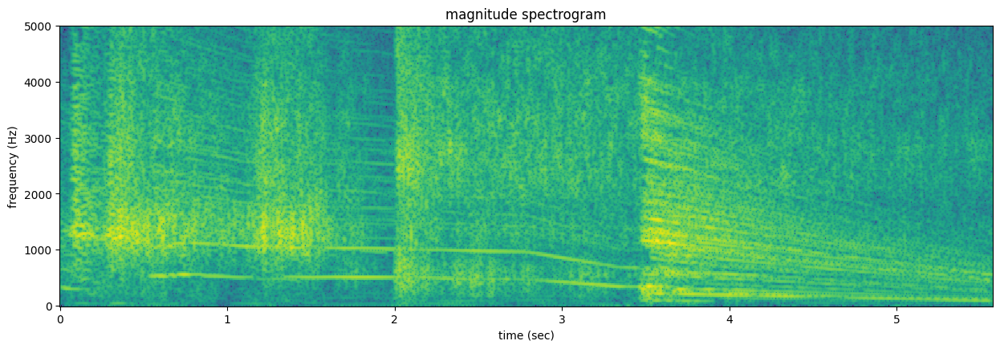

In [232]:
Ns = 512
H = 128
freqScaling = np.array([0, 1.0,
     0.5, 0.8,
     1.25, 0.7,
     1.5, 0.5,
     2.5, 0.2 ])
#[Input Time, Output Time] 
timeScaling = np.array([ 0.0, 0.0,
     0.7, 0.7,
     1, 3,
     1.15, 3.15,
     2.0, 4.0,
     2.5, 5.0, ])  

ysfreq, ysmag = ST.sineTimeScaling(tfreq, tmag, timeScaling)
ystocEnv = STOT.stochasticTimeScale(stocEnv, timeScaling)


yhfreqt = ST.sineFreqScaling(ysfreq, freqScaling)
# synthesis from the trasformed hps representation 
ysc, yh, yst = SPS.spsModelSynth(yhfreqt, ysmag, np.array([]), ystocEnv, Ns, H, fs)

ipd.display(ipd.Audio(data=ysc, rate=fs))

# plot magnitude spectrogram
mX, pX = STFT.stftAnal(ysc, w, N, H)
plt.figure(figsize=(15, 10))
maxplotfreq = 5000.0
plt.subplot(2,1,2)
numFrames = int(mX[:,0].size)
frmTime = H*np.arange(numFrames)/float(fs)
binFreq = fs*np.arange(N*maxplotfreq/fs)/N
plt.pcolormesh(frmTime, binFreq, np.transpose(mX[:,:int(N*maxplotfreq/fs+1)]))
plt.xlabel('time (sec)')
plt.ylabel('frequency (Hz)')
plt.title('magnitude spectrogram')



For time stretching, the initial 0.7 seconds are preserved, as we wanted to keep the first two noisy parts of the first event original. The segment from 0.7 to 1.0 seconds is then stretched to last from 0.7 to 3.0 seconds, emphasizing the second instrument's resonances. This part sounds chaotic and noisy due to the extended attack and overlapping partials. Afterwards, the time scale stays unchanged, until after the final gong/cymbal hit, where the “stable,” sustained part of the gong/cymbal is slightly extended by about 0.05 seconds. This approach preserves the original transients while stretching the more resonant, sustained portions, allowing the frequency scaling effect to be more noticeable.

The freqScaling array defines how the pitch of the sinusoidal tracks changes over time. Each pair [time, scaling_factor] specifies a multiplicative factor for the sinusoidal frequencies at that moment. Factors less than 1 lower the pitch, while factors greater than 1 raise it. In this case, the pitch gradually decreases over time, with the initial frequencies unchanged, then dropping to 80%, 70%, 50%, and finally 20% of the original value, creating a smooth downward gliding effect. This effect is clearly visible in the plotted spectrogram as slowly descending partials.

The resulting audio has chaotic slowed passages and gradually descending pitch, while preserving the original timbre and stochastic texture. The transformed audio gives the impression of a machine slowly breaking down, with chaotic attacks followed by progressively lower, resonant tones.

### Final results: concatenation
The final audio piece is created by layering all the previous sounds on an empty canvas of 20 seconds. The duration of 20 seconds was computed by adding all the durations of the different segments. Each sound is placed at a specific start time, chosen manually so that it begins when the previous sound ends. A custom function handles this placement, allowing sounds to overlap by summing their amplitudes and adjusting volumes. Once all sounds are added, the mix is normalized to prevent clipping and preserve audio quality. This method allows control over the timing of each element, resulting in a coherent multi-layered composition.


In [233]:
#CONCATENATION
# 1. Determine total length (e.g., 30 seconds)
total_duration = 20.0
total_samples = int(total_duration * fs)

# 2. Create the empty canvas (Silent background)
final_mix = np.zeros(total_samples)

# 3. Function to add sound at a specific time
def add_sound(canvas, sound, start_time_sec, fs, volume=1.0):
    start_sample = int(start_time_sec * fs)
    end_sample = start_sample + len(sound)
    
    # Check if sound goes past the end of canvas
    if end_sample > len(canvas):
        end_sample = len(canvas)
        sound = sound[:end_sample - start_sample] # Crop sound
        
    # Add sound to canvas (Mixing)
    canvas[start_sample : end_sample] += sound * volume
    return canvas

# 4. Build your track
# Start Bass at 0.0s
final_mix = add_sound(final_mix, y_bass, 0.0, fs, volume=1.2)

final_mix = add_sound(final_mix, y_sinf, 2.5, fs, volume=1.2)


final_mix = add_sound(final_mix, ysc, 5.0, fs, volume=0.8)


final_mix = add_sound(final_mix, y_sinf, 10.5, fs, volume=1.2)

final_mix = add_sound(final_mix, y_bass, 12.0, fs, volume=1.2)

final_mix = add_sound(final_mix, y_morph, 14.5, fs, volume=1.2)

# 5. Normalize (Prevents clipping distortion)
final_mix = final_mix / np.max(np.abs(final_mix))

# 6. Play
""" ipd.display(ipd.Audio(data=y_bass, rate=fs))
ipd.display(ipd.Audio(data=y_morph, rate=fs))
ipd.display(ipd.Audio(data=y_sinf, rate=fs))
ipd.display(ipd.Audio(data=ysc, rate=fs)) """

ipd.display(ipd.Audio(data=final_mix, rate=fs))

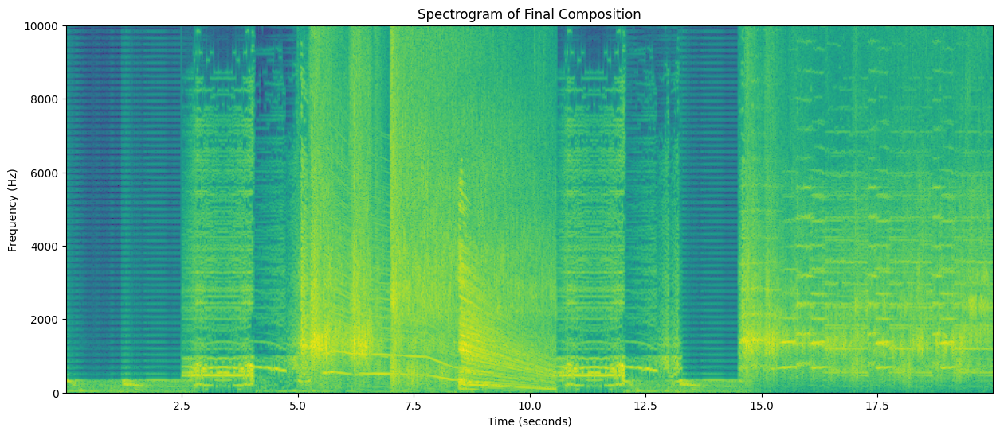

In [191]:
import matplotlib.pyplot as plt

# Create the figure (Wide aspect ratio for a timeline)
plt.figure(figsize=(15, 6))

# Use the built-in specgram function
# NFFT: FFT size (2048 gives good frequency detail)
# noverlap: Overlap (1024 makes it look smooth)
# cmap='viridis': Uses the yellow/green/blue color scheme you are used to
plt.specgram(final_mix, NFFT=2048, Fs=fs, noverlap=1024, cmap='viridis')

# Add Labels
plt.xlabel('Time (seconds)')
plt.ylabel('Frequency (Hz)')
plt.title('Spectrogram of Final Composition')
plt.axis('tight') # Removes white borders
plt.ylim(0, 10000) # Zoom in to 0-10kHz (Audio usually doesn't have much interesting above 10k)

plt.show()

The piece begins with the first heavily filtered segment, creating a deep, low-frequency ambient tone. This is followed by the louder but still filtered time-stretched sinusoidal component. Next, the frequency- and time-scaled sound is added, which is very noisy and loud, giving the impression of a broken machine. The filtered and time-stretched sounds are then repeated as a base to connect with the final segment, which is the morphed with the oboe sound, ending with a stretched echo that repeats the final part. Overall, the piece has an ambient, experimental feel, and the sounds could be interpreted as urban or mechanical, even though all the material comes from orchestral percussion. It is very interesting how transforming percussive elements alone can create textures that suggest machines, traffic, or cityscapes.